# 0. Overview

**Project Model:**

Propose a formulation and rewrite a pretrained deep generative model with user defined specific rules without dataset.

The rule is defined when user is doing copy and paste.

Several GAN models are appropriate for rewriting, such as StyleGAN2 and ProgressiveGAN. Note that this method will only change one layer instead of the whole generator.

The final formulation the [paper](https://arxiv.org/pdf/2007.15646.pdf) proposed is $W_{1} = W_{0} + \Lambda * d^{-1}$

(suppose the weights of layer L are updated)

*   $W_{0} :$ weights of layer L in the pretrained model.
*   $\Lambda :$ can be found using the optimization, as L2-Norm method mentioned in ML lectures.
*   $d^{-1} :$ is calculated with context chosed, and the d is also the update direction of W.

**Extension**

Change a pre-trained model and apply the rewriting model, also finding the best layers for some specific cases.

**Note:** Original Notebook is in the appendix

#1. Set up enviroment and prepare code.
  First, as tensorflow 2.x is not supported for stylegan2, we need to install tensorflow 1.x (1.14 or 1.15) as recomended for the experiment.

  We also need an NVIDIA GPU, so we config Runtime->change runtime type->Hardware accelerator. Also, install ninja to support CUDA.

  Then, download stylegan2 model code from github.
  
  Finally, print and check the tensorflow version and GPU type.


In [ ]:
%tensorflow_version 1.x
import tensorflow as tf

# install ninja build systems
!pip install ninja

# Download the code
!git clone https://github.com/NVlabs/stylegan2.git 
!git clone https://github.com/rosinality/stylegan2-pytorch.git
!git clone https://github.com/davidbau/rewriting.git model_rewrite

print('Tensorflow version: {}'.format(tf.__version__) )
!nvidia-smi -L
print('GPU Identified at: {}'.format(tf.test.gpu_device_name()))

TensorFlow 1.x selected.
     |████████████████████████████████| 112kB 2.7MB/s 
Cloning into 'stylegan2'...
remote: Enumerating objects: 122, done.
remote: Total 122 (delta 0), reused 0 (delta 0), pack-reused 122
Receiving objects: 100% (122/122), 590.23 KiB | 11.14 MiB/s, done.
Resolving deltas: 100% (55/55), done.
Cloning into 'stylegan2-pytorch'...
remote: Enumerating objects: 331, done.
remote: Total 331 (delta 0), reused 0 (delta 0), pack-reused 331
Receiving objects: 100% (331/331), 122.49 MiB | 40.10 MiB/s, done.
Resolving deltas: 100% (163/163), done.
Cloning into 'model_rewrite'...
remote: Enumerating objects: 148, done.
remote: Counting objects: 100% (148/148), done.
remote: Compressing objects: 100% (109/109), done.
remote: Total 627 (delta 72), reused 99 (delta 39), pack-reused 479
Receiving objects: 100% (627/627), 102.69 MiB | 42.92 MiB/s, done.
Resolving deltas: 100% (234/234), done.
Tensorflow version: 1.15.2
GPU 0: Tesla P100-PCIE-16GB (UUID: GPU-657fb874-5387-8db1-e8e

In [ ]:
try: # set up path
    import google.colab, sys, torch
    sys.path.append('/content/model_rewrite')
    if not torch.cuda.is_available():
        print("Change runtime type to include a GPU.")  
except:
    pass

# 2. Download a pre-trained stylegan2 model 


In [ ]:
#upload panda model
#Resolution: 256x256 config: f
#Author: mit-han-lab 
!wget https://hanlab.mit.edu/projects/data-efficient-gans/models/stylegan2-100-shot-panda.pkl


--2020-10-23 17:59:55--  https://hanlab.mit.edu/projects/data-efficient-gans/models/stylegan2-100-shot-panda.pkl
Resolving hanlab.mit.edu (hanlab.mit.edu)... 18.25.8.36
Connecting to hanlab.mit.edu (hanlab.mit.edu)|18.25.8.36|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 357309050 (341M)
Saving to: ‘stylegan2-100-shot-panda.pkl’

stylegan2-100-shot- 100%[===================>] 340.76M  62.5MB/s    in 5.5s    

2020-10-23 18:00:01 (61.4 MB/s) - ‘stylegan2-100-shot-panda.pkl’ saved [357309050/357309050]



In [ ]:
#Anime portraits
#Resolution: 512x512 config: f
#Author: Aaron Gokaslan 
!wget https://markdown-1256328326.cos.ap-beijing.myqcloud.com/2020-01-11-skylion-stylegan2-animeportraits-networksnapshot-024664.pkl.xz -O stylegan2-animeportraits.pkl.xz
#unzip the file 
!xz -d stylegan2-animeportraits.pkl.xz

--2020-10-23 18:00:01--  https://markdown-1256328326.cos.ap-beijing.myqcloud.com/2020-01-11-skylion-stylegan2-animeportraits-networksnapshot-024664.pkl.xz
Resolving markdown-1256328326.cos.ap-beijing.myqcloud.com (markdown-1256328326.cos.ap-beijing.myqcloud.com)... 106.119.171.34, 106.119.171.35, 106.119.171.36, ...
Connecting to markdown-1256328326.cos.ap-beijing.myqcloud.com (markdown-1256328326.cos.ap-beijing.myqcloud.com)|106.119.171.34|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 335517216 (320M) [application/x-xz]
Saving to: ‘stylegan2-animeportraits.pkl.xz’

stylegan2-animeport 100%[===================>] 319.97M  11.6MB/s    in 51s     

2020-10-23 18:00:54 (6.23 MB/s) - ‘stylegan2-animeportraits.pkl.xz’ saved [335517216/335517216]



#3. Convert the weight to pytorch

We need to convert the trained weights to pytorch so that the weights file can be loaded by rewriting model's styleGAN port. Thought those port, we can using the methods(rewriting a generative model) which is discussed in the article dirctly.

After running this command, we will get a converted *.pt file with a set of sample pictures which are generated by styleGAN2 model.

In [ ]:
# panda
#!python /content/stylegan2-pytorch/convert_weight.py --repo /content/stylegan2 /content/stylegan2-100-shot-panda.pkl
# anime petraits
!python /content/stylegan2-pytorch/convert_weight.py --repo /content/stylegan2 /content/stylegan2-animeportraits.pkl

Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Compiling... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Compiling... Loading... Done.
tensor(0.0002, device='cuda:0')


#4. Rewrite the pre-trained model

**a) choose GAN class**

There are different kings of GAN network, which deep generative model should we choose to rewritng. According to the [paper](https://arxiv.org/pdf/2007.15646.pdf), both progressiveGAN and StyleGAN have feature patchs which are isolated from neighboring feature, which means GAN can generated the features of an image seprated from their neiboring loacations in the middle layer. This property make those two GAN network suit for the model rewriting. We choose the StyleGAN2 for the experiments because many pre-trianed StyleGAN2 models are open-source.

**b) choose a pre-trained model**

Justin collects many [Awesome Pretrained StyleGAN2](https://github.com/justinpinkney/awesome-pretrained-stylegan2) models in github. Some models have been tested by [demo](https://https://colab.research.google.com/github/davidbau/rewriting/blob/master/notebooks/rewriting-interface.ipynb#scrollTo=lwpFWmZYYe2Z) such as church and horse, some models were train by a small dataset so it can only generated almost alike picture such as [styleGAN2-panda-model](https://hanlab.mit.edu/) which is not suitable for model rewriting. Finally, we choose Anime portraits model which was trained by [Aaron Gokaslan](https://skylion007.github.io/)so that we can get lots of amazing changed by rewriting this model.

**c) choose layer**

Different layers work well on different modifications. In the next step, we try to change rule in different layers to see if this method can perform well on a custom pre-trained model.


In [ ]:
from utils import zdataset, show, labwidget
from rewrite import ganrewrite, rewriteapp
import torch, copy, os, json
from torchvision.utils import save_image
import utils.stylegan2, utils.proggan
from utils.stylegan2 import SeqStyleGAN2

# Resolution (size) and style dimensionality (style_dim and n_mlp) 
# are determined by the pre-trained model 
model = SeqStyleGAN2(size=512, style_dim=512, n_mlp=8, truncation=0.5, mconv='seq')

#load the exponential moving average model weights, put it on the GPU.
#state_dict = torch.load('stylegan2-100-shot-panda.pt')
state_dict = torch.load('stylegan2-animeportraits.pt')

model.load_state_dict(state_dict['g_ema'], latent_avg=state_dict['latent_avg'])
model.cuda()

#layer 7 perfrom well on adding something above hair
#layer 9 perfrom well on making closed eyes open

layernum = 8 
sample_size = 1000 # a small sample of images for computing statistics
zds = zdataset.z_dataset_for_model(model, size=sample_size)
gw = ganrewrite.SeqStyleGanRewriter(
    model, zds, layernum,
    cachedir='experiments')

savedir = 'masks'

# gw: gan rewirte model
# size, mask_dir, num_canvases: interface configuration with defining 
#                  256*256 image size, mask saved direction, and number of images in canvases    
interface = rewriteapp.GanRewriteApp(gw, size=256, mask_dir=savedir, num_canvases=64)
show(interface)

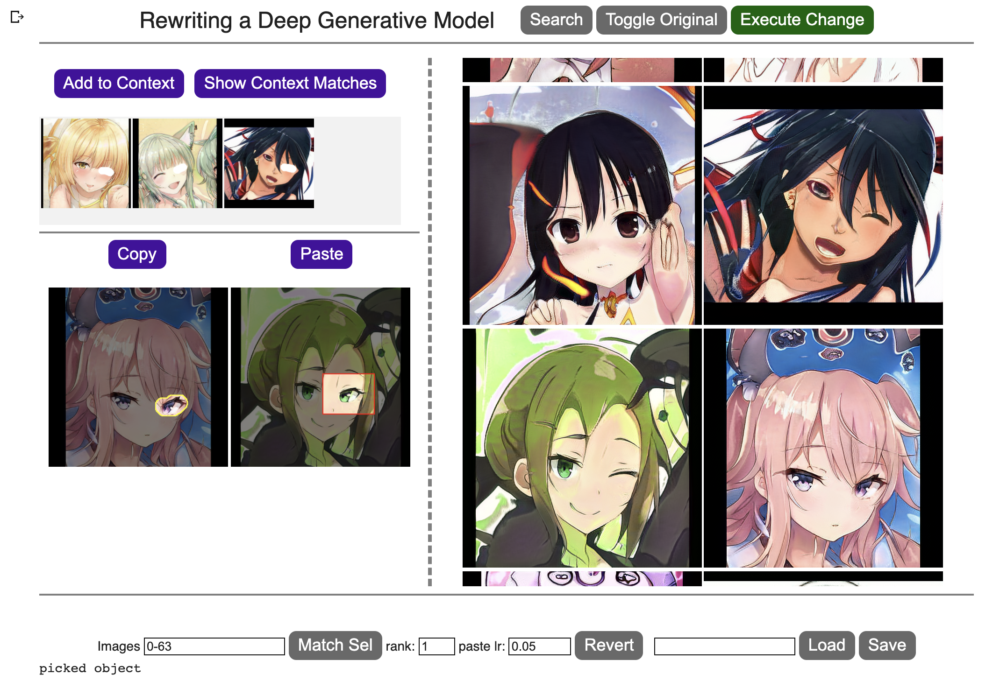

# 5. Find the best layer

The layer number is an important arttribute in the rewriting model which can influence greatly on the effect of the results because different layer matches different features of the image. We choose the anime portraits model to do more experiements, finding out the best layers for adding something on portraits' head and making those closed eyes open. 

From appendix H in the [paper](https://arxiv.org/pdf/2007.15646.pdf), rewriting layers 6-11 are more appropriate for StyleGANv2 and Progressive GAN because of FID (Fr´echet Inception Distance) mentioned.
To find the best layer for each case, we try different layer number from 6 to 11, and with ordered operations of choosing contex copying traget object, pasting to a new image, and excuting to editing other matched iamges, we get edited images and compare them to conclude the best layer for each case. 

To contral variable, we choose same target region, copy and paste same in same area on layer 6-11, which made our experiment more reliable. We put our results and conclusion below.


In [ ]:
!wget https://github.com/kim0215/ML-project/raw/main/hair.png
!wget https://github.com/kim0215/ML-project/raw/main/eye.png
!wget https://github.com/kim0215/ML-project/raw/main/hair6-11layer.jpg
!wget https://github.com/kim0215/ML-project/raw/main/eye6-11layer.jpg


**Case1: Find the best layer for adding something on portraits' head**

a) choose the context that alone hairs on the head

b) copy a flower from a portrait

c) paste the flower on a portraint's head 

*optional*  d) show those part in images that matched with seleted context 

d) click to execute for adding on other images

c) save and compare the results


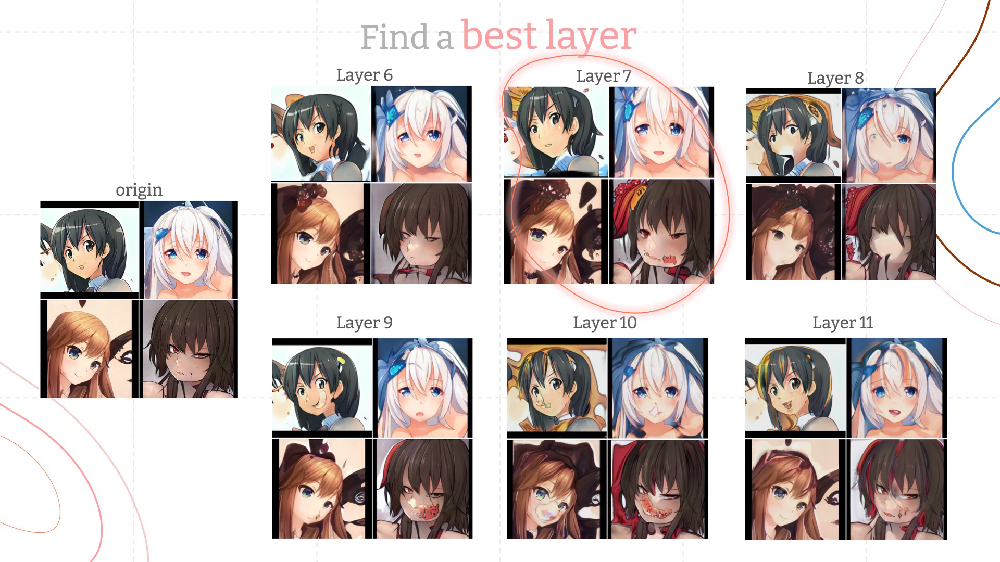

In [ ]:
from PIL import Image
# here shows the results of layer 6-11
im_hair=Image.open('hair6-11layer.jpg')
im_hair



From above result screenshots and more specific images, we can conclude that the best layer is 7 for rewrting model in this case. 

In the [provided demo notebook](https://colab.research.google.com/github/davidbau/rewriting/blob/master/notebooks/rewriting-interface.ipynb), it mentions that the layer 8 is good for adding trees on churches, and hats on horses. Morever, we find the layer 6 is scondly good for adding flower on head. So we think the layer around 7 is appropriate for adding something above an object.


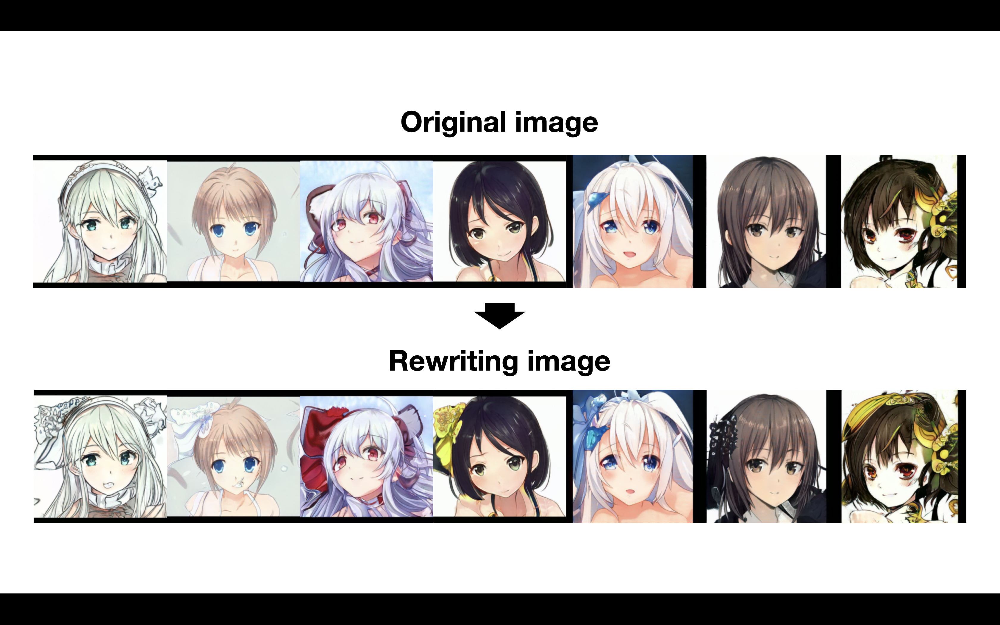

In [ ]:
# here shows some the best layer rewriting resultss
im_hair=Image.open('hair.png')
im_hair

**Case2: Find the best layer for making portraits' closed eyes open**

a) choose the context where there is closed eye (or samll eye)

b) copy a open eye from a portrait

c) paste the open eye on a portraint's closed (or small) eye

*optional* d) show those part in images that matched with seleted context

d) click to execute for editing eyes on other images

c) save and compare the results

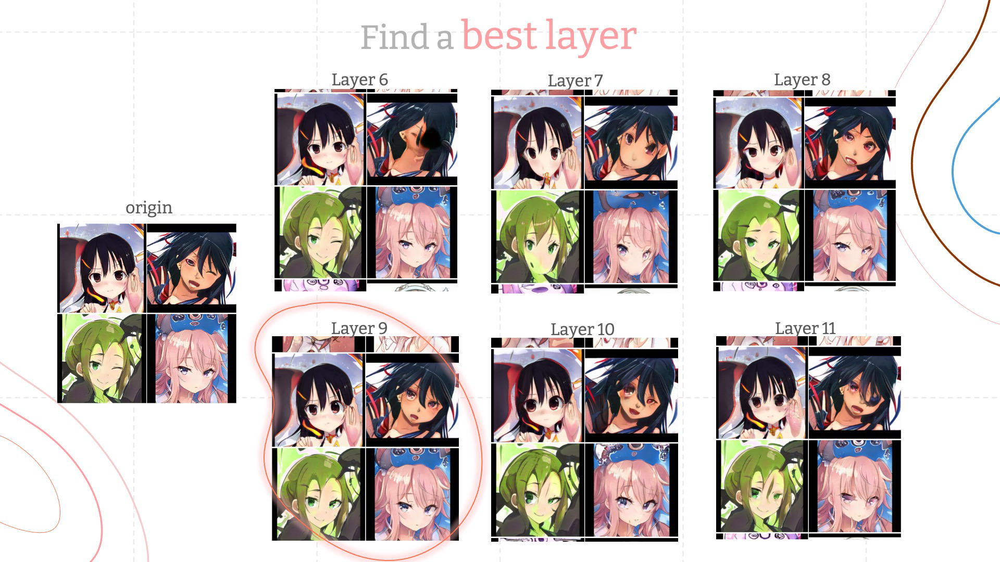

In [ ]:
# here shows the results of layer 6-11
im_hair=Image.open('eye6-11layer.jpg')
im_hair

From above result screenshots and more specific images, it is obvious that the best layer is 9 for rewrting model in this case. 

In the [provided demo notebook](https://colab.research.google.com/github/davidbau/rewriting/blob/master/notebooks/rewriting-interface.ipynb), it mentions that the layer 10 is good for pasting hair on faces. So we think the layer around 9 or 10 is appropriate for changing something on face.


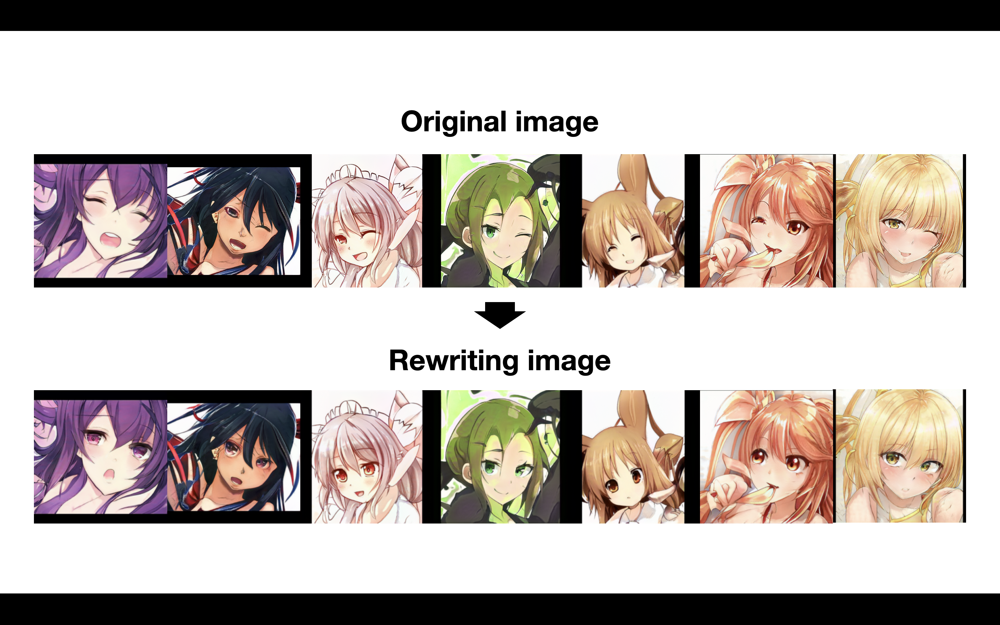

In [ ]:
# here shows some the best layer rewriting results
im_eye=Image.open('eye.png')
im_eye

# 6. Model Analysis
Advantages：
1.   Generate a model without dataset
2.   Creat a set of images with the same defined rules at once
3.   When paste an object to a new image, the style of the object will be changed to match the new image
4.   Help researchers deplore more insights into GAN layers and rules

Disadvantages:
1.   Relay too much on the pre-trained model: if a pre-trained model is not good enough, the rewriting model will not do a good job
2.   Over-match the target regions: copied objects may be generated on the position which is mismatched actually
3.   Unstable result effect: depend too much on user operations including the context, copy, and paste region. Even small mistake on the operation will lead to awful results.

Application Scenario:
1.   Implement the rewriting idea on other model research
2.   Animation production
3.   Editing images
4.   Architecture design
5.   More...



---
# Appendix


### Instructions
To run the code below:
1. Read the comments, and alter settings if you wish to change the model or layer.
2. Then run all the cells to download models and run the UI.

To operate the interface:
1. In the UI, enter numbers such as "200-212" in the Image Number entry to see generated images.
2. Click on a region of an image and "Add to context" to help define a rule to change.
3. Click "Search" to find other images that are affected by the same rule.
4. Click on a region of an image and "Copy" to choose a new pattern to use.
5. Click on a target region of an image and "Paste" to paste the pattern in a new place.  Clicking around the red box can adjust it.
6. Click "Execute" to see the effects.  "Toggle" compares to the original model, and "Revert" discards the edit.

Editing a model is challenging, because you need to develop an understanding of the way the model organies its rules.  You can build your intuition by using the "Highlight" button to see how the model generalizes regions that you select in the context.

Particular model edits can be saved or loaded as json files; and other geeky details
can be seen in the source code at http://github.com/davidbau/rewriting.  This
research code is not yet optimized for speed, and contributions are welcome.


In [ ]:
%%bash
!(stat -t /usr/local/lib/*/dist-packages/google/colab > /dev/null 2>&1) && exit 
pip install ninja 2>> install.log
git clone https://github.com/davidbau/rewriting.git tutorial_code 2>> install.log

In [ ]:
try: # set up path
    import google.colab, sys, torch
    sys.path.append('/content/tutorial_code')
    if not torch.cuda.is_available():
        print("Change runtime type to include a GPU.")  
except:
    pass

In [ ]:
from utils import zdataset, show, labwidget
from rewrite import ganrewrite, rewriteapp
import torch, copy, os, json
from torchvision.utils import save_image
import utils.stylegan2, utils.proggan
from utils.stylegan2 import load_seq_stylegan

# Choices: ganname = 'stylegan' or ganname = 'proggan'
ganname = 'stylegan'

# Choices: modelname = 'church' or faces' or 'horse' or 'kitchen'
modelname = 'church'

# layer 6,7,8,9,10 work OK for different things.
# layer 8 is good for trees or domes in churches, and hats on horses
# layer 6 is good for smiles on faces
# layer 10 is good for hair on faces
layernum = 8

# Number of images to sample when gathering statistics.
size = 1000

# Make a directory for caching some data.
layerscheme = 'default'
expdir = 'results/pgw/%s/%s/%s/layer%d' % (ganname, modelname, layerscheme, layernum)
os.makedirs(expdir, exist_ok=True)

# Load (and download) a pretrained GAN
if ganname == 'stylegan':
    model = load_seq_stylegan(modelname, mconv='seq', truncation=0.50)
    Rewriter = ganrewrite.SeqStyleGanRewriter
elif ganname == 'proggan':
    model = utils.proggan.load_pretrained(modelname)
    Rewriter = ganrewrite.ProgressiveGanRewriter
    
# Create a Rewriter object - this implements our method.
zds = zdataset.z_dataset_for_model(model, size=size)
gw = Rewriter(
    model, zds, layernum, cachedir=expdir,
    low_rank_insert=True, low_rank_gradient=False,
    use_linear_insert=False,  # If you set this to True, increase learning rate.e
    key_method='zca')

# Display a user interface to allow model rewriting.
savedir = f'masks/{ganname}/{modelname}'
interface = rewriteapp.GanRewriteApp(gw, size=256, mask_dir=savedir, num_canvases=32)
show(interface)